In [1]:
!pip install missingno

## Melbourne House Prices
- use the sample notebook from here: https://www.kaggle.com/code/mennatullahelsahy/analysis-preprocessing-for-housing-market

This dataset from here https://www.kaggle.com/datasets/anthonypino/melbourne-housing-market?select=Melbourne_housing_FULL.csv
    
1. `Suburb:` The name of the suburb where the property is located.
2. `Address:` The specific address of the property.
3. `Rooms:` The number of rooms in the property (bedrooms, living rooms, etc.).
4. `Price:` The price of the property in Australian dollars. 
5. `Method:` The method used for selling the property (e.g., auction, private sale).
6. `Type:` The type of property (house, unit, townhouse, etc.).
7. `SellerG:` The name of the real estate agent who sold the property.
8. `Date:` The date when the property was sold.
9. `Distance:` The distance of the property from the central business district (CBD) in kilometers.
10. `Regionname:` The general region of Melbourne where the property is located (e.g., West, North East).
11. `Propertycount:` The number of properties that exist in the same suburb.
12. `Bedroom2:` The number of bedrooms in the property (as scraped from a different source).
13. `Bathroom:` The number of bathrooms in the property.
14. `Car:` The number of parking spots available for cars.
15. `Landsize:` The size of the land associated with the property, measured in square meters.
16. `BuildingArea:` The size of the building or property's interior, measured in square meters.
17. `YearBuilt:` The year in which the property was built.
18. `CouncilArea:` The governing council for the area where the property is located.
19. `Latitude:` The latitude coordinate of the property's location.
20. `Longitude:` The longitude coordinate of the property's location.

In [2]:
print('0.1 - Performing EDA - Melbourne House Prices')

0.1 - Performing EDA - Melbourne House Prices


In [3]:
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin
from bokeh.palettes import brewer
from bokeh.models import ColumnDataSource, Whisker, NumeralTickFormatter
from bokeh.plotting import figure, show
from bokeh.transform import factor_cmap
from bokeh.io import show, output_notebook
import plotly.express as px

output_notebook()
df_housing = pd.read_csv('../dataset/Melbourne_housing_FULL.csv')
df_housing.head()


Loading BokehJS ...

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [4]:
df_housing.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,34857.000000,2.724700e+04,34856.000000,34856.000000,26640.000000,26631.000000,26129.000000,23047.000000,13742.00000,15551.000000,26881.000000,26881.000000,34854.000000
mean,3.031012,1.050173e+06,11.184929,3116.062859,3.084647,1.624798,1.728845,593.598993,160.25640,1965.289885,-37.810634,145.001851,7572.888306
std,0.969933,6.414671e+05,6.788892,109.023903,0.980690,0.724212,1.010771,3398.841946,401.26706,37.328178,0.090279,0.120169,4428.090313
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1196.000000,-38.190430,144.423790,83.000000
25%,2.000000,6.350000e+05,6.400000,3051.000000,2.000000,1.000000,1.000000,224.000000,102.00000,1940.000000,-37.862950,144.933500,4385.000000
50%,3.000000,8.700000e+05,10.300000,3103.000000,3.000000,2.000000,2.000000,521.000000,136.00000,1970.000000,-37.807600,145.007800,6763.000000
75%,4.000000,1.295000e+06,14.000000,3156.000000,4.000000,2.000000,2.000000,670.000000,188.00000,2000.000000,-37.754100,145.071900,10412.000000
max,16.000000,1.120000e+07,48.100000,3978.000000,30.000000,12.000000,26.000000,433014.000000,44515.00000,2106.000000,-37.390200,145.526350,21650.000000


In [5]:
df_housing.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

In [6]:
df_housing.dtypes

Suburb            object
Address           object
Rooms              int64
Type              object
Price            float64
Method            object
SellerG           object
Date              object
Distance         float64
Postcode         float64
Bedroom2         float64
Bathroom         float64
Car              float64
Landsize         float64
BuildingArea     float64
YearBuilt        float64
CouncilArea       object
Lattitude        float64
Longtitude       float64
Regionname        object
Propertycount    float64
dtype: object

## 1. Perform Exploratory Data Analysis:
- check distributions
- check for outliers
- feature selection
- remove nulls
- inspect and remove outliers (after EDA)
- standardisation, and one-hot-encoding or label encoding, as required



<Axes: >

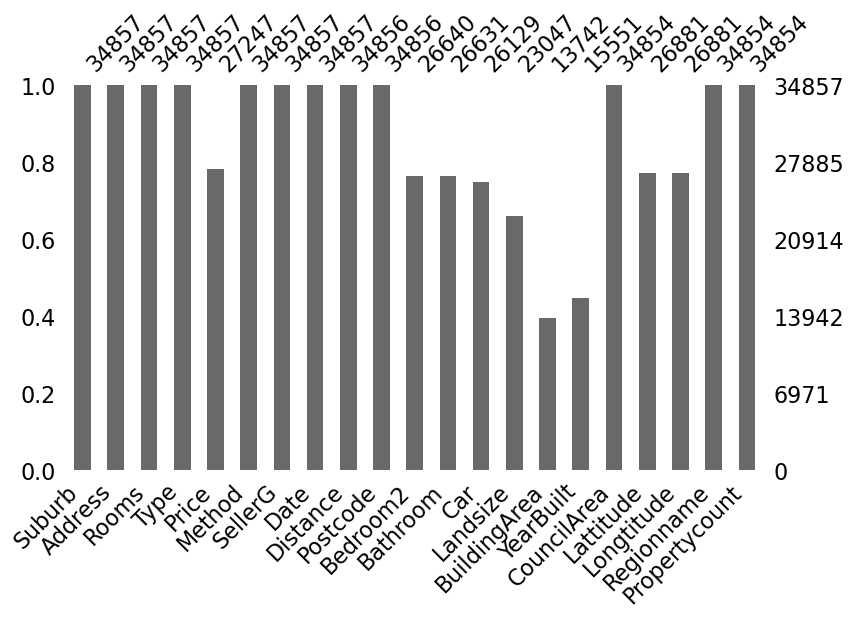

In [7]:
# visual way to find out null values, and which columns
msno.bar(df_housing, figsize=(9, 5))

In [8]:
# even quicker way to find where the null values are
df_housing.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price             7610
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
CouncilArea          3
Lattitude         7976
Longtitude        7976
Regionname           3
Propertycount        3
dtype: int64

## 2. Take care of nulls
...

In [9]:
# quick and dirty imputation using ML, for the specified cloumns
ml_imputer = IterativeImputer(max_iter=50, random_state=0)
numeric_na = ['Distance','Postcode','Bedroom2','Bathroom','Car','YearBuilt','Lattitude','Longtitude','Propertycount']
df_housing[numeric_na] = ml_imputer.fit_transform(df_housing[numeric_na])

# mode imputation, for the specified columns
simple_imputer = SimpleImputer(strategy='most_frequent')
categorical_na = ['Regionname','CouncilArea']
df_housing[categorical_na] = simple_imputer.fit_transform(df_housing[categorical_na])

# median for the price
simple_imputer = SimpleImputer(strategy='median')
price_na = ['Price', 'Landsize','BuildingArea']
df_housing[price_na] = simple_imputer.fit_transform(df_housing[price_na])

df_housing.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

In [10]:
df_housing.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,34857.000000,3.485700e+04,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000
mean,3.031012,1.010838e+06,11.184929,3116.062859,3.081017,1.623808,1.720403,569.001520,145.562827,1964.706858,-37.810490,145.001537,7572.889838
std,0.969933,5.719992e+05,6.788795,109.022339,0.863182,0.633936,0.883481,2763.907731,252.222644,27.252674,0.079724,0.107026,4427.899776
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.190430,144.423790,83.000000
25%,2.000000,6.950000e+05,6.400000,3051.000000,2.927147,1.000000,1.000000,357.000000,136.000000,1952.159424,-37.848150,144.960400,4385.000000
50%,3.000000,8.700000e+05,10.300000,3103.000000,3.000000,1.620173,1.824335,521.000000,136.000000,1964.409907,-37.808110,145.002700,6763.000000
75%,4.000000,1.150000e+06,14.000000,3156.000000,3.351753,2.000000,2.000000,598.000000,136.000000,1979.712364,-37.770890,145.053040,10412.000000
max,16.000000,1.120000e+07,48.100000,3978.000000,30.000000,12.000000,26.000000,433014.000000,44515.000000,2106.000000,-37.390200,145.526350,21650.000000


<Axes: >

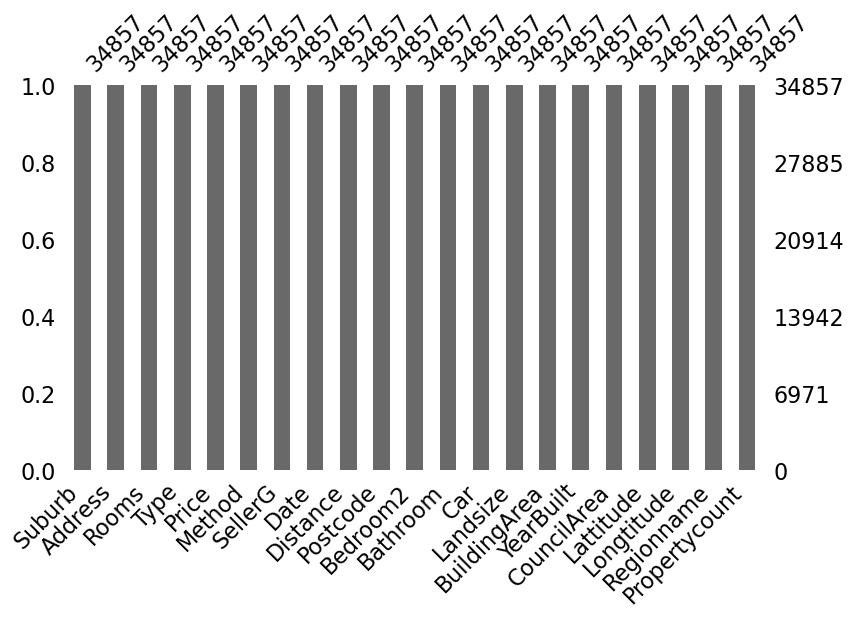

In [11]:
# visual way to find out null values, and which columns
msno.bar(df_housing, figsize=(9, 5))

In [12]:
# select the columns that will remain in the dataset
# Remove Postcode, Address, SellerG, Date, Bedroom2, YearBuilt, CouncilArea, Lattitude, Longitude, Regionname from the dataset
# due insufficient data and/or too many categories as in the case of Postcode
base_columns = ['Rooms','Type','Price','Method','Distance','Bathroom','Car','Landsize','Propertycount','Regionname']
df_housing = df_housing[base_columns]
df_housing

,Rooms,Type,Price,Method,Distance,Bathroom,Car,Landsize,Propertycount,Regionname
0,2,h,870000.0,SS,2.5,1.000000,1.000000,126.0,4019.0,Northern Metropolitan
1,2,h,1480000.0,S,2.5,1.000000,1.000000,202.0,4019.0,Northern Metropolitan
2,2,h,1035000.0,S,2.5,1.000000,0.000000,156.0,4019.0,Northern Metropolitan
3,3,u,870000.0,VB,2.5,2.000000,1.000000,0.0,4019.0,Northern Metropolitan
4,3,h,1465000.0,SP,2.5,2.000000,0.000000,134.0,4019.0,Northern Metropolitan
...,...,...,...,...,...,...,...,...,...,...
34852,4,h,1480000.0,PI,6.3,1.000000,3.000000,593.0,6543.0,Western Metropolitan
34853,2,h,888000.0,SP,6.3,2.000000,1.000000,98.0,6543.0,Western Metropolitan
34854,2,t,705000.0,S,6.3,1.000000,2.000000,220.0,6543.0,Western Metropolitan
34855,3,h,1140000.0,SP,6.3,1.559868,1.605657,521.0,6543.0,Western Metropolitan


In [13]:
df_housing = df_housing.astype(
    {
        'Propertycount': 'int',
        'Bathroom': 'int',
        'Car': 'int',
    })

df_housing.dtypes

Rooms              int64
Type              object
Price            float64
Method            object
Distance         float64
Bathroom           int64
Car                int64
Landsize         float64
Propertycount      int64
Regionname        object
dtype: object

In [14]:
df_housing

,Rooms,Type,Price,Method,Distance,Bathroom,Car,Landsize,Propertycount,Regionname
0,2,h,870000.0,SS,2.5,1,1,126.0,4019,Northern Metropolitan
1,2,h,1480000.0,S,2.5,1,1,202.0,4019,Northern Metropolitan
2,2,h,1035000.0,S,2.5,1,0,156.0,4019,Northern Metropolitan
3,3,u,870000.0,VB,2.5,2,1,0.0,4019,Northern Metropolitan
4,3,h,1465000.0,SP,2.5,2,0,134.0,4019,Northern Metropolitan
...,...,...,...,...,...,...,...,...,...,...
34852,4,h,1480000.0,PI,6.3,1,3,593.0,6543,Western Metropolitan
34853,2,h,888000.0,SP,6.3,2,1,98.0,6543,Western Metropolitan
34854,2,t,705000.0,S,6.3,1,2,220.0,6543,Western Metropolitan
34855,3,h,1140000.0,SP,6.3,1,1,521.0,6543,Western Metropolitan


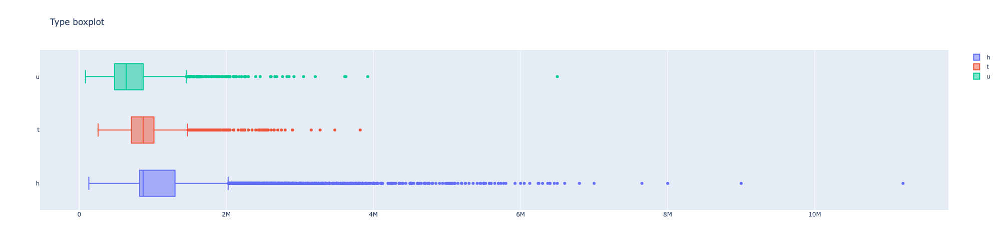

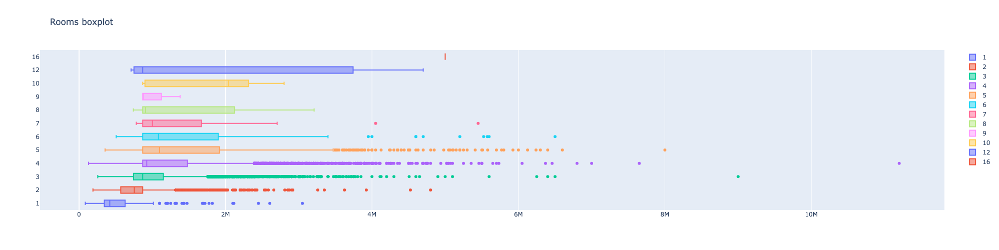

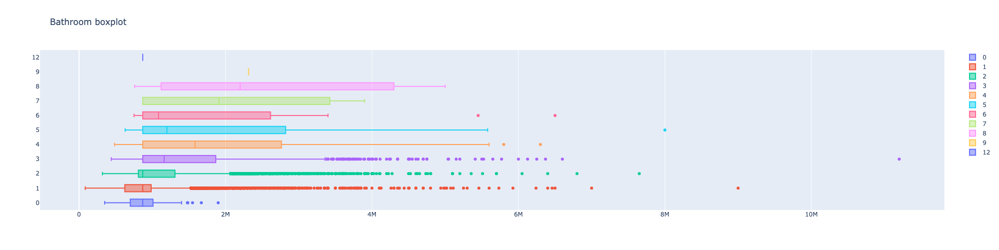

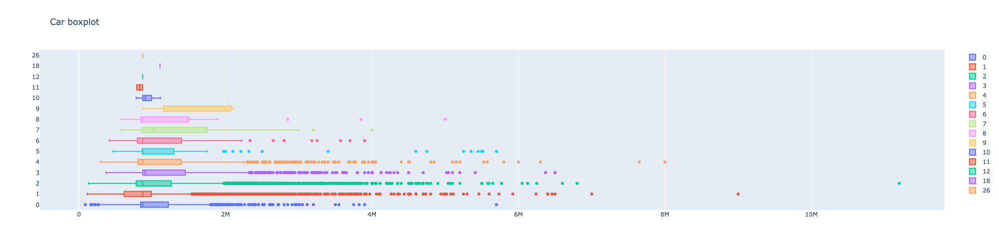

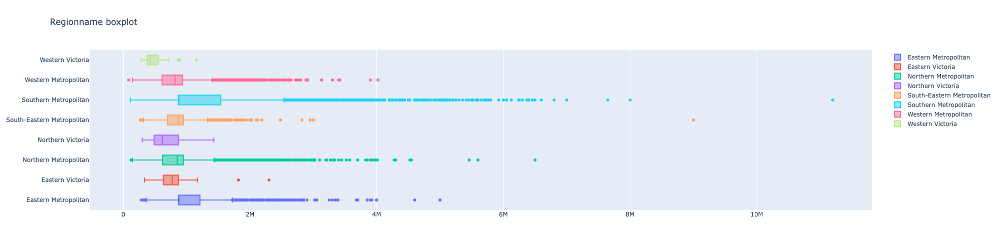

In [15]:
import plotly.graph_objects as go

def show_quantile_plots(dataframe, col):
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
 
    boxplot = sns.boxplot(x='Price', y=col, data=dataframe, orient='h')
    boxplot.set(title=f'{col.title()} Boxplot')
    
    current_axis = plt.gca()
    current_values = current_axis.get_xticks() / 1000000
    current_axis.xaxis.set_ticks(current_axis.get_xticks())
    current_axis.set_xticklabels(['${:,.0f}M'.format(x) for x in current_values])
    
def show_quantile_plotly(dataframe, col):
    fig = go.Figure()
    types = dataframe[col].unique()
    types.sort()
    for prop_type in types:
        fig.add_trace(
            go.Box(
                x=dataframe[dataframe[col] == prop_type]['Price'],
                name=str(prop_type)))
        
    fig.update_layout(
        height=500,
        width=1000,
        title_text=f'{col} boxplot')
    fig.show()

cat_columns = ['Type','Rooms','Bathroom','Car','Regionname']
for i in cat_columns:
    show_quantile_plotly(df_housing, i)

In [16]:
df_housing.describe()

,Rooms,Price,Distance,Bathroom,Car,Landsize,Propertycount
count,34857.000000,3.485700e+04,34857.000000,34857.000000,34857.000000,34857.000000,34857.000000
mean,3.031012,1.010838e+06,11.184929,1.478813,1.568236,569.001520,7572.889778
std,0.969933,5.719992e+05,6.788795,0.686408,0.930540,2763.907731,4427.899776
min,1.000000,8.500000e+04,0.000000,0.000000,0.000000,0.000000,83.000000
25%,2.000000,6.950000e+05,6.400000,1.000000,1.000000,357.000000,4385.000000
50%,3.000000,8.700000e+05,10.300000,1.000000,1.000000,521.000000,6763.000000
75%,4.000000,1.150000e+06,14.000000,2.000000,2.000000,598.000000,10412.000000
max,16.000000,1.120000e+07,48.100000,12.000000,26.000000,433014.000000,21650.000000


## 4. Removing the outliers
- House with 16 or more rooms? 
- House with 9 or more bathrooms?
- Property with 9 or more car spaces? 

For the following points that I have above, its quite obvious that we somehow need to curate the data to be more representative of a typical range of proeprties. A property with 16 bedrooms, or 9 bathrooms, or more bathrooms that I have fingers on one hand are nothing but typical. 

For each datapoint, there are also outliers that are more easily evident in the plots. It's kinda easy in this dataset because it is easy because almost everyone will have some intuition with property prices and what affects it. But how do you programmatically remove outliers without having to understand the data at a deeper level? The answer is using statistics and the IQR as a guide. 

In [17]:
def remove_extreme_outliers(df, column):
    # IQR
    # Calculate the upper and lower limits
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - (1.5 * IQR)
    upper = Q3 + (1.5 * IQR)

    # Create arrays of Boolean values indicating the outlier rows
    upper_array = np.where(df[column] >= upper)[0]
    lower_array = np.where(df[column] <= lower)[0]

    # Removing the outliers
    print(f'Dropping rows < lower limits: {len(lower_array)}')
    print(f'Dropping rows > upper limits: {len(upper_array)}')
    df.drop(index=upper_array, inplace=True)
    df.reset_index(inplace=True, drop=True)
    df.drop(index=lower_array, inplace=True)
    df.reset_index(inplace=True, drop=True)

def remove_excessive_rooms(df, column='Rooms'):
    exess_rooms_idxs = np.where(df[column] > 7)[0]
    print(f'Dropping rows > 9 rooms: {len(exess_rooms_idxs)}')
    df.drop(index=exess_rooms_idxs, inplace=True)
    df.reset_index(inplace=True, drop=True)

def remove_excessive_bathrooms(df, column='Bathroom'):
    exess_rooms_idxs = np.where(df[column] > 6)[0]
    print(f'Dropping rows > 8 bathrooms: {len(exess_rooms_idxs)}')
    df.drop(index=exess_rooms_idxs, inplace=True)
    df.reset_index(inplace=True, drop=True)
    
def remove_excessive_carspace(df, column='Car'):
    exess_rooms_idxs = np.where(df[column] > 8)[0]
    print(f'Dropping rows > 8 carspaces: {len(exess_rooms_idxs)}')
    df.drop(index=exess_rooms_idxs, inplace=True)
    df.reset_index(inplace=True, drop=True)
    
remove_extreme_outliers(df_housing, 'Price')
remove_extreme_outliers(df_housing, 'Landsize')
remove_excessive_rooms(df_housing)
remove_excessive_bathrooms(df_housing)
remove_excessive_carspace(df_housing)

Dropping rows < lower limits: 0
Dropping rows > upper limits: 2556
Dropping rows < lower limits: 0
Dropping rows > upper limits: 1138
Dropping rows > 9 rooms: 16
Dropping rows > 8 bathrooms: 3
Dropping rows > 8 carspaces: 6


## Remove illegal rows
...

In [18]:
def remove_illegal_Distance(df):
    column='Distance'
    print(f"Dropping rows with negative {column}: {len(df[(df[column] < 0)])}")
    idxs = np.where(df[column] < 0)[0]
    if (len(idxs) > 0):
        df.drop(index=idxs, inplace=True)
        df.reset_index(inplace=True, drop=True)
        
def remove_illegal_Price(df):
    column='Price'
    print(f"Dropping rows with negative {column}: {len(df[(df[column] <= 0)])}")
    idxs = np.where(df[column] <= 0)[0]
    if (len(idxs) > 0):
        df.drop(index=idxs, inplace=True)
        df.reset_index(inplace=True, drop=True)        
        
def remove_illegal_Landsize(df):
    column='Landsize'
    print(f"Dropping rows with negative or zero {column}: {len(df[(df[column] <= 20)])}")
    idxs = np.where(df[column] <= 20)[0]
    if (len(idxs) > 0):
        df.drop(index=idxs, inplace=True)
        df.reset_index(inplace=True, drop=True)
                

In [19]:
remove_illegal_Distance(df_housing)
remove_illegal_Landsize(df_housing)
remove_illegal_Price(df_housing)

Dropping rows with negative Distance: 0
Dropping rows with negative or zero Landsize: 2415
Dropping rows with negative Price: 0


In [20]:
df_housing.describe()

,Rooms,Price,Distance,Bathroom,Car,Landsize,Propertycount
count,28723.000000,2.872300e+04,28723.000000,28723.000000,28723.000000,28723.000000,28723.000000
mean,3.042266,9.104505e+05,11.790791,1.436166,1.556906,496.194443,7548.867180
std,0.879968,3.185347e+05,6.794226,0.632921,0.881846,173.558128,4544.131066
min,1.000000,1.120000e+05,0.000000,0.000000,0.000000,27.000000,129.000000
25%,2.000000,7.000000e+05,7.000000,1.000000,1.000000,438.000000,4217.000000
50%,3.000000,8.700000e+05,11.100000,1.000000,1.000000,521.000000,6543.000000
75%,4.000000,1.050000e+06,14.600000,2.000000,2.000000,581.000000,10412.000000
max,7.000000,1.832000e+06,48.100000,6.000000,8.000000,950.000000,21650.000000


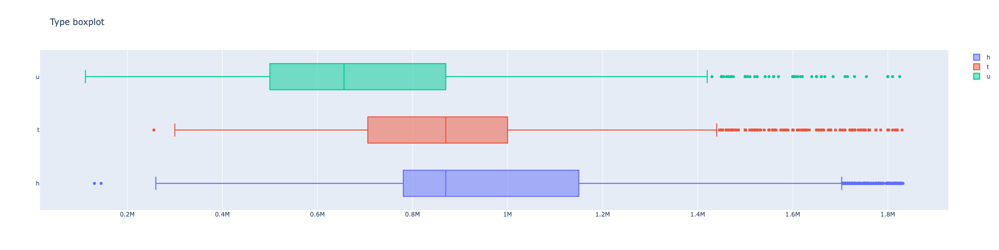

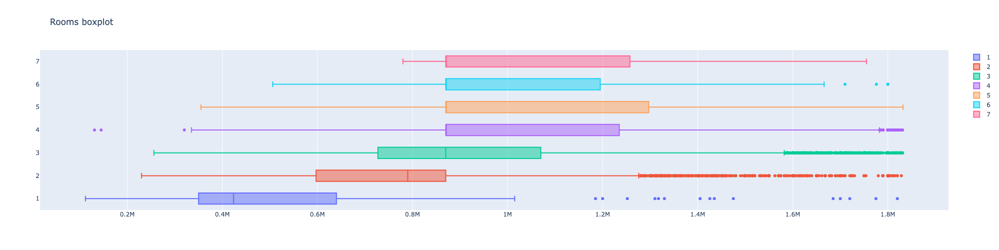

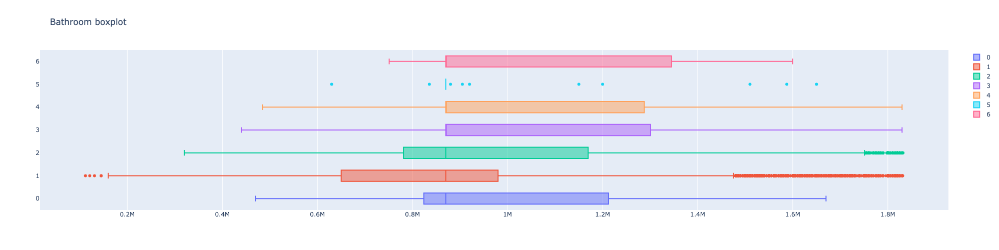

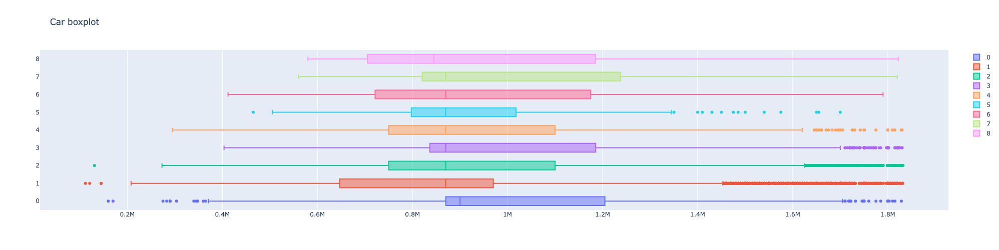

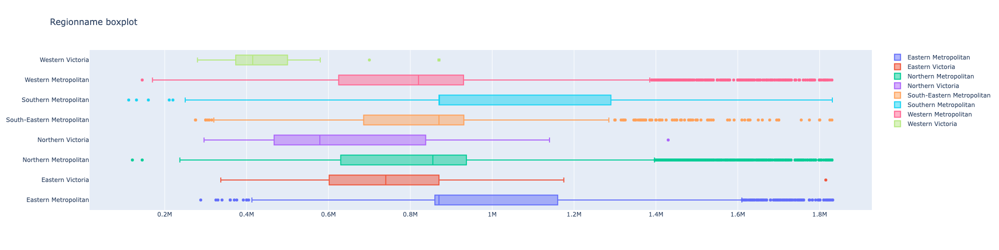

In [21]:
# After doing all that, let's plot again
cat_columns = ['Type','Rooms','Bathroom','Car','Regionname']
for i in cat_columns:
    show_quantile_plotly(df_housing, i)

In [22]:
df_housing.describe()

,Rooms,Price,Distance,Bathroom,Car,Landsize,Propertycount
count,28723.000000,2.872300e+04,28723.000000,28723.000000,28723.000000,28723.000000,28723.000000
mean,3.042266,9.104505e+05,11.790791,1.436166,1.556906,496.194443,7548.867180
std,0.879968,3.185347e+05,6.794226,0.632921,0.881846,173.558128,4544.131066
min,1.000000,1.120000e+05,0.000000,0.000000,0.000000,27.000000,129.000000
25%,2.000000,7.000000e+05,7.000000,1.000000,1.000000,438.000000,4217.000000
50%,3.000000,8.700000e+05,11.100000,1.000000,1.000000,521.000000,6543.000000
75%,4.000000,1.050000e+06,14.600000,2.000000,2.000000,581.000000,10412.000000
max,7.000000,1.832000e+06,48.100000,6.000000,8.000000,950.000000,21650.000000


<Axes: >

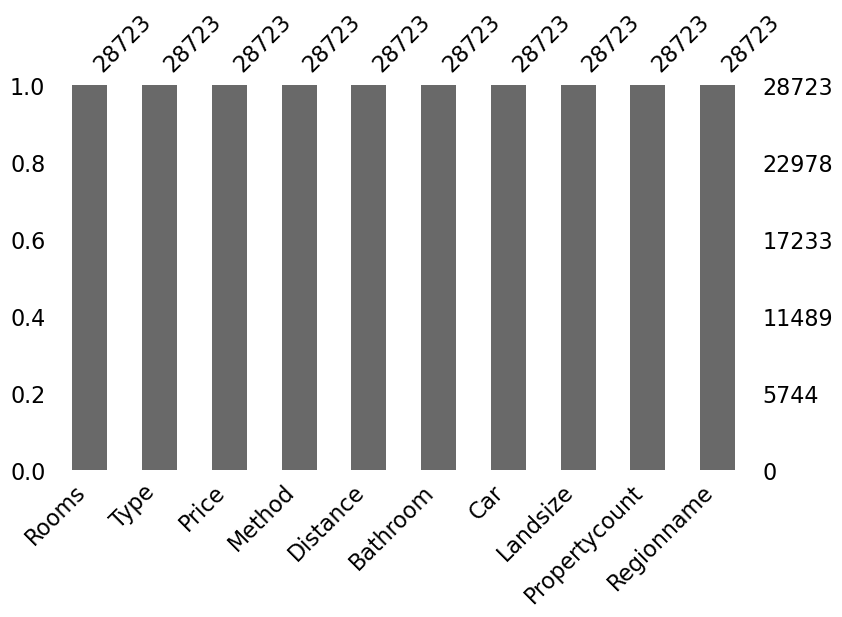

In [23]:
# visual way to find out null values, and which columns
msno.bar(df_housing, figsize=(9, 5))

## 5. Check distributions
...

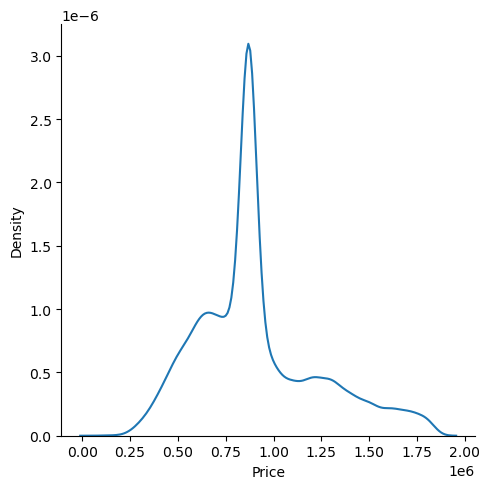

In [24]:
sns.displot(df_housing, x="Price", kind="kde")

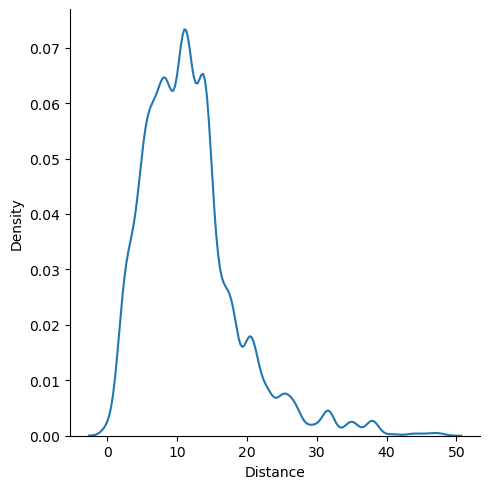

In [25]:
sns.displot(df_housing, x="Distance", kind="kde")

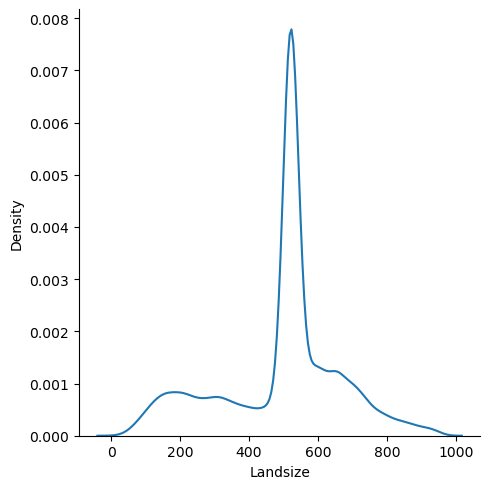

In [26]:
sns.displot(df_housing, x="Landsize", kind="kde")

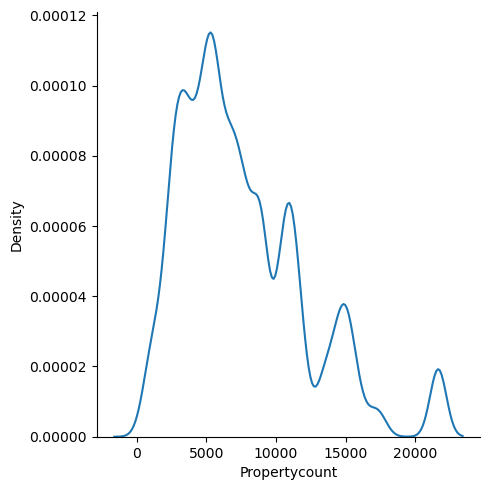

In [27]:
sns.displot(df_housing, x="Propertycount", kind="kde")

/Users/josereyes/anaconda3/lib/python3.10/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



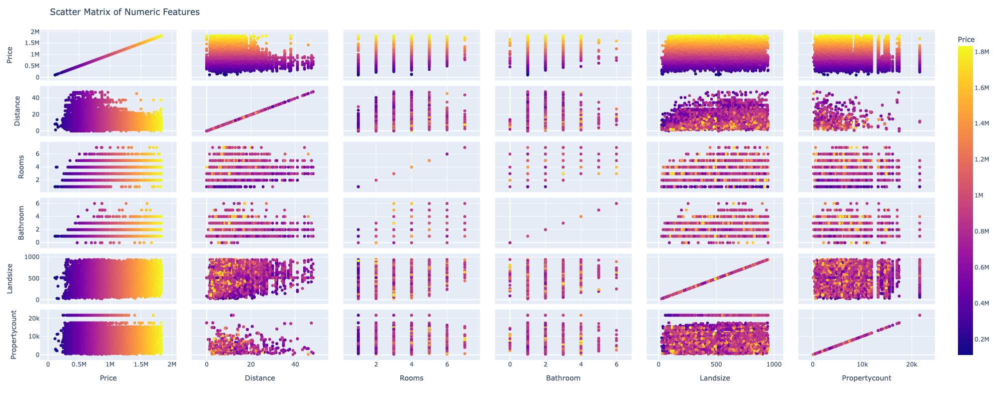

In [28]:
fig = px.scatter_matrix(
    df_housing, 
    dimensions=['Price','Distance','Rooms','Bathroom','Landsize','Propertycount'], 
    color="Price")

fig.update_layout(height=800, width=1000, title_text="Scatter Matrix of Numeric Features")

fig.show()

## 6. Feature selection
...

<Axes: >

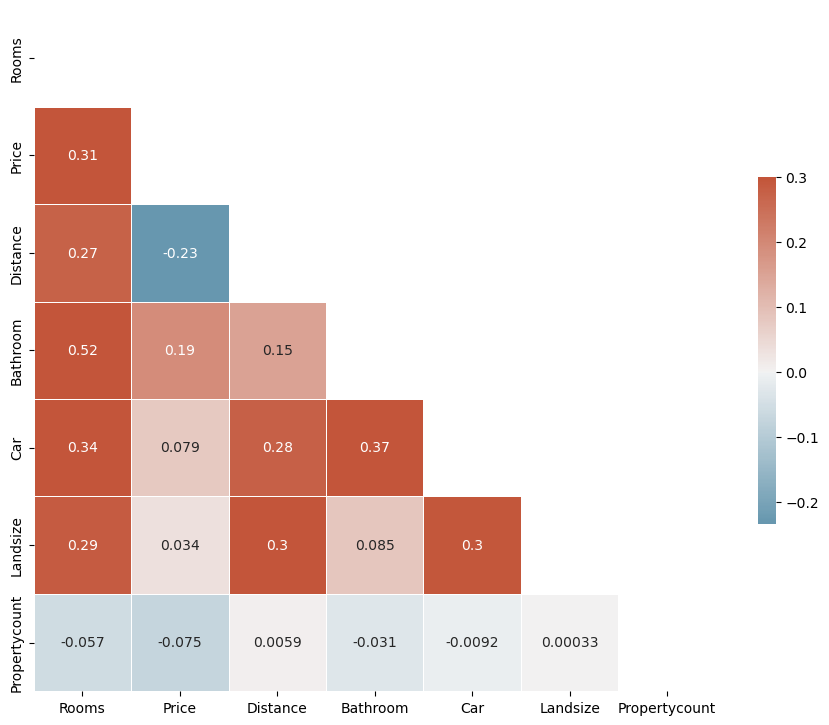

In [29]:
corr = df_housing.corr(numeric_only=True)

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr,
            mask=mask,
            cmap=cmap,
            vmax=.3,
            center=0,
            annot=True,
            square=True,
            linewidths=.5,
            cbar_kws={"shrink": .5})

## 7. SKLearn Pipeline for transformation
...

In [30]:
df_housing.dtypes

Rooms              int64
Type              object
Price            float64
Method            object
Distance         float64
Bathroom           int64
Car                int64
Landsize         float64
Propertycount      int64
Regionname        object
dtype: object

In [31]:
from sklearn import set_config
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score

# TODO: create custom estimators for the multiple transformations we've done, and add them to the pipeline below
numeric_features = ['Rooms', 'Distance', 'Bathroom', 'Car', 'Landsize', 'Propertycount']
print(numeric_features)
numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="mean")),
        ("scaler", StandardScaler()),
    ]
)

categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder()),
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("numeric", numeric_transformer, numeric_features),
        ("categorical", categorical_transformer, ['Type','Method','Regionname'])     
    ]
)

pipeline = Pipeline(
    steps=[
        ("preprocessing", preprocessor)
    ]
)

['Rooms', 'Distance', 'Bathroom', 'Car', 'Landsize', 'Propertycount']


In [32]:
set_config(display="diagram")
pipeline

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Rooms', 'Distance',
                                                   'Bathroom', 'Car',
                                                   'Landsize',
                                                   'Propertycount']),
                                                 ('categorical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder())]),
                                                  ['Type', 'Method',
                                                   'Regionname'])]))])

In [33]:
# df_housing.reset_index(inplace=True, drop=True)

# shuffle the dataframe before splitting it
# df_housing = df_housing.sample(frac=1, random_state=42)

In [34]:
df_housing.reset_index(inplace=True, drop=True)
df_housing_train, temp = train_test_split(df_housing, test_size=0.3, stratify=df_housing[['Regionname']], shuffle=True)
df_housing_validation, df_housing_test = train_test_split(temp, test_size=0.5)

df_housing_train.reset_index(inplace=True, drop=True)
df_housing_validation.reset_index(inplace=True, drop=True)
df_housing_test.reset_index(inplace=True, drop=True)
print(df_housing_train.shape)
print(df_housing_validation.shape)
print(df_housing_test.shape)

(20106, 10)
(4308, 10)
(4309, 10)


In [35]:
std_scaler = StandardScaler()

y_train = std_scaler.fit_transform(df_housing_train[['Price']])
y_validation = std_scaler.transform(df_housing_validation[['Price']])
y_test = std_scaler.transform(df_housing_test[['Price']])
print(f'y_train.shape: {y_train.shape}')
print(f'y_validation.shape: {y_validation.shape}')
print(f'y_test.shape: {y_test.shape}')

X_train = df_housing_train.drop(['Price'], axis=1)
X_validation = df_housing_validation.drop(['Price'], axis=1)
X_test = df_housing_test.drop(['Price'], axis=1)

X_train.columns

X_train = pipeline.fit_transform(X_train)
X_validation = pipeline.transform(X_validation)
X_test = pipeline.transform(X_test)

xdf = pd.DataFrame(X_train, columns=['Rooms', 'Distance', 'Bathroom', 'Car', 'Landsize', 'Propertycount','Type[1]','Type[2]','Type[3]',
              'Method[1]','Method[2]','Method[3]','Method[4]','Method[5]','Method[6]','Method[7]','Method[8]','Method[9]',
              'Regionname[1]','Regionname[2]','Regionname[3]','Regionname[4]','Regionname[5]','Regionname[6]','Regionname[7]','Regionname[8]'])
xdf


y_train.shape: (20106, 1)
y_validation.shape: (4308, 1)
y_test.shape: (4309, 1)


,Rooms,Distance,Bathroom,Car,Landsize,Propertycount,Type[1],Type[2],Type[3],Method[1],...,Method[8],Method[9],Regionname[1],Regionname[2],Regionname[3],Regionname[4],Regionname[5],Regionname[6],Regionname[7],Regionname[8]
0,-0.047182,-0.059119,0.881908,0.501495,-1.144330,-0.165006,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-2.313943,-0.795439,-0.689071,-0.629654,0.140741,-0.547624,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.047182,-0.059119,-0.689071,-0.629654,0.140741,-0.873631,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,-0.047182,-0.191657,-0.689071,-0.629654,0.140741,0.668514,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.180562,-0.898523,-0.689071,-0.629654,0.140741,-1.007558,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20101,-0.047182,-0.397826,0.881908,0.501495,-0.914853,-1.445024,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
20102,-1.180562,1.604962,-0.689071,0.501495,0.140741,0.938791,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
20103,-1.180562,-1.237230,-0.689071,-1.760803,-1.953237,-1.011083,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
20104,1.086199,0.294314,0.881908,0.501495,0.140741,0.754421,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [36]:
import statsmodels.api as sm

df_reg = xdf[['Rooms', 'Distance', 'Bathroom', 'Car', 'Landsize', 'Propertycount','Type[1]','Type[2]','Type[3]',
              'Method[1]','Method[2]','Method[3]','Method[4]','Method[5]','Method[6]','Method[7]','Method[8]','Method[9]',
              'Regionname[1]','Regionname[2]','Regionname[3]','Regionname[4]','Regionname[5]','Regionname[6]','Regionname[7]','Regionname[8]']]
X_sm = sm.add_constant(df_reg, has_constant="add")
lm_model = sm.OLS(y_train, X_sm).fit()
print(lm_model.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.377
Method:                 Least Squares   F-statistic:                     508.4
Date:                Mon, 11 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:22:29   Log-Likelihood:                -23757.
No. Observations:               20106   AIC:                         4.756e+04
Df Residuals:                   20081   BIC:                         4.776e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           5.46e+11   1.45e+12      0.375

In [37]:
from sklearn.metrics import r2_score, mean_absolute_error
from tensorflow.keras import backend as K

def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

y_pred = lm_model.predict(sm.add_constant(X_train, has_constant="add"))

print(f'r2_score: {r2_score(y_true = y_train, y_pred = y_pred)}')
print(f'rmse: {rmse(y_train, y_pred)}')

r2_score: 0.3779508812244762
rmse: 1.173875643343245


In [38]:
y_pred = lm_model.predict(sm.add_constant(X_test, has_constant="add"))

print(f'r2_score: {r2_score(y_true = y_test, y_pred = y_pred)}')
print(f'rmse: {rmse(y_test, y_pred)}')
# print(f'mean_absolute_error: {mean_absolute_error(y_true = y_test, y_pred = y_pred)}')
# r2_score(y_true = y_test, y_pred = y_pred)


r2_score: 0.3705270611027276
rmse: 1.1784997099444894


In [39]:
# !pip install tensorflow

In [40]:
# try neural network
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.optimizers.legacy import Adam

from tensorflow.keras.callbacks import EarlyStopping
tf.random.set_seed(42)
callback = EarlyStopping(monitor='loss', patience=3)

def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

nn_model = Sequential([
    Dense(64, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

nn_model.compile(
    loss=rmse,
    optimizer=Adam(),
    metrics=[rmse]
)

nn_model.fit(X_train, y_train, epochs=15, callbacks=[callback])

Epoch 1/15
629/629 [==============================] - 0s 479us/step - loss: 0.7293 - rmse: 0.7295
Epoch 2/15
629/629 [==============================] - 0s 478us/step - loss: 0.6774 - rmse: 0.6773
Epoch 3/15
629/629 [==============================] - 0s 477us/step - loss: 0.6659 - rmse: 0.6660
Epoch 4/15
629/629 [==============================] - 0s 476us/step - loss: 0.6623 - rmse: 0.6625
Epoch 5/15
629/629 [==============================] - 0s 478us/step - loss: 0.6571 - rmse: 0.6568
Epoch 6/15
629/629 [==============================] - 0s 479us/step - loss: 0.6542 - rmse: 0.6542
Epoch 7/15
629/629 [==============================] - 0s 475us/step - loss: 0.6509 - rmse: 0.6508
Epoch 8/15
629/629 [==============================] - 0s 479us/step - loss: 0.6475 - rmse: 0.6475
Epoch 9/15
629/629 [==============================] - 0s 480us/step - loss: 0.6455 - rmse: 0.6456
Epoch 10/15
629/629 [==============================] - 0s 476us/step - loss: 0.6427 - rmse: 0.6426
Epoch 11/15
629/629

In [41]:
# try train set prediction
predictions = nn_model.predict(X_train)
predictions[:5]

629/629 [==============================] - 0s 233us/step


array([[ 0.48130894],
       [-1.6176591 ],
       [ 0.3378024 ],
       [ 0.8451814 ],
       [ 0.29551622]], dtype=float32)

In [42]:
print(f'r2_score: {r2_score(y_true = y_train, y_pred = predictions)}')
print(f'rmse: {rmse(y_train, predictions)}')

r2_score: 0.5947566094986682
rmse: 0.6365872999843241


In [43]:
# try test set prediction
predictions = nn_model.predict(X_test)
predictions[:5]

135/135 [==============================] - 0s 193us/step


array([[-1.5378988 ],
       [-0.31738532],
       [ 0.1408804 ],
       [ 1.0993176 ],
       [ 1.0387825 ]], dtype=float32)

In [44]:
print(f'r2_score: {r2_score(y_true = y_test, y_pred = predictions)}')
print(f'rmse: {rmse(y_test, predictions)}')

r2_score: 0.5234596931066102
rmse: 0.6911189937453965


In [45]:
# try train set prediction, and inverse scale to get the $ Price
y_predict = nn_model.predict(X_train)
y = std_scaler.inverse_transform(y_predict)
print(y[:5])
print(df_housing_train.iloc[:5]['Price'])

629/629 [==============================] - 0s 188us/step
[[1062656.6 ]
 [ 394768.16]
 [1016993.06]
 [1178440.2 ]
 [1003537.6 ]]
0     870000.0
1     250000.0
2    1092500.0
3    1475000.0
4    1428000.0
Name: Price, dtype: float64


In [46]:
# try test set prediction, and inverse scale to get the $ Price
y_predict = nn_model.predict(X_test)
y = std_scaler.inverse_transform(y_predict)
print(y[:5])
print(df_housing_test.iloc[:5]['Price'])

135/135 [==============================] - 0s 192us/step
[[ 420147.75]
 [ 808513.3 ]
 [ 954332.75]
 [1259306.  ]
 [1240043.9 ]]
0     425000.0
1     560000.0
2     870000.0
3    1661000.0
4     870000.0
Name: Price, dtype: float64
